In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import umap
import pacmap
from sklearn.manifold import TSNE

import torch

def normalise_(zx, zy):
    """normalise coordinates to 0~1

    :param z: normalised coordinates
    """
    if type(zx) == type(torch.ones(1)):
        if torch.min(zx)!=torch.max(zx):
            zx = (zx - torch.min(zx)) / (torch.max(zx) - torch.min(zx))
        if torch.min(zy)!=torch.max(zy):
            zy = (zy - torch.min(zy)) / (torch.max(zy) - torch.min(zy))
        z = torch.hstack([zx.reshape(-1,1), zy.reshape(-1,1)])
    
    if type(zx) == type(np.ones(1)):
        if np.min(zx)!=np.max(zx):
            zx = (zx - np.min(zx)) / (np.max(zx) - np.min(zx))
        if np.min(zy)!=np.max(zy):
            zy = (zy - np.min(zy)) / (np.max(zy) - np.min(zy))
        z = np.hstack([zx.reshape(-1,1), zy.reshape(-1,1)])

    return z

def normalise(z):

    if len(z.shape)==2:
        z = normalise_(z[:,0], z[:,1])
    elif len(z.shape)==3:
        res_li = []
        for i in range(len(z)):
            res_li.append(normalise_(z[i,:,0].squeeze(), z[i,:,1].squeeze()))
        z = torch.stack(res_li, dim=0)
    else:
        print("wrong z.shape")
        exit()

    return z

In [2]:
import pandas as pd
import seaborn as sn

import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt

def draw_z(z, cls, s=25, x_highlight=None, y_highlight=None, save_path=None, display=True, title=None, palette="Spectral", dpi=600):
    """draw data and labels

    :param z: (n, 2) -- 2D data
    :param cls: (n, ) -- label/class for datapoints
    :param s: size, defaults to 25
    """
    
    # re-organise as df
    try:
        tsne_data = np.hstack((z.numpy(), cls.reshape((-1,1)).numpy()))
    except:
        tsne_data = np.hstack((z, cls.reshape((-1,1))))

    tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))
    tsne_df = tsne_df.sort_values("label")

    # draw
    plt.figure(figsize=(10, 10), dpi=dpi)
    
    # main figure
    sn.FacetGrid(tsne_df, hue="label", height=6, palette=palette).map(plt.scatter, "Dim_1", "Dim_2", s=s).add_legend()
    # highlights
    if x_highlight!=None and y_highlight!=None:
        plt.scatter(x_highlight, y_highlight, marker='*', s=20, c='black', label='Highlighted Point')

    # dpi    
    matplotlib.rcParams["figure.dpi"] = dpi
    
    # axes range
    plt.xlim((0, 1))
    plt.ylim((0, 1))

    if title!=None:
        plt.title(title)
    
    if save_path!=None:
        plt.savefig(save_path, bbox_inches='tight')    

    if display==True:
        plt.show()
    else:
        plt.ioff()
        plt.clf()
        plt.close()

In [3]:
def sample_W(W, nSamples, isRandom=True):
    n = W.shape[0]
    random_indices = np.random.choice(n, size=nSamples, replace=False)
    return W[random_indices]

def calculate_ph_dim(W, min_points=200, max_points=1000, point_jump=50,  
        h_dim=0, print_error=False):
    from ripser import ripser
    # sample_fn should output a [num_points, dim] array
    
    # sample our points
    test_n = range(min_points, max_points, point_jump)
    lengths = []
    for n in test_n:
        diagrams = ripser(sample_W(W, n))['dgms']
        
        if len(diagrams) > h_dim:
            d = diagrams[h_dim]
            d = d[d[:, 1] < np.inf]
            lengths.append((d[:, 1] - d[:, 0]).sum())
        else:
            lengths.append(0.0)
    lengths = np.array(lengths)
    
    # compute our ph dim by running a linear least squares
    x = np.log(np.array(list(test_n)))
    y = np.log(lengths)
    N = len(x)
    m = (N * (x * y).sum() - x.sum() * y.sum()) / (N * (x ** 2).sum() - x.sum() ** 2)
    b = y.mean() - m * x.mean()
    
    error = ((y - (m * x + b)) ** 2).mean()
    
    if print_error:
        print(f"Ph Dimension Calculation has an approximate error of: {error}.")
    return 1 / (1 - m)


def MST_length(z, k=5):
    z = normalise(z)

    A = kneighbors_graph(z, n_neighbors=k, mode='distance', metric='euclidean', include_self=False)

    G = nx.Graph(A)

    MST = nx.minimum_spanning_tree(G)

    length = sum(weight for _, _, weight in MST.edges(data='weight'))

    return length

In [4]:
def generate_points_on_segment(A, B, num_points):
    # Extract coordinates of points A and B
    x1, y1 = A
    x2, y2 = B
    
    # Calculate the increment for each coordinate
    delta_x = (x2 - x1) / (num_points + 1)
    delta_y = (y2 - y1) / (num_points + 1)
    
    # Generate points on the segment
    points = []
    for i in range(1, num_points + 1):
        x = x1 + i * delta_x
        y = y1 + i * delta_y
        points.append((x, y))
    
    return points

In [5]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

from sklearn.metrics import mean_squared_error, silhouette_score

# Task-driven

shape: (1000, 2)


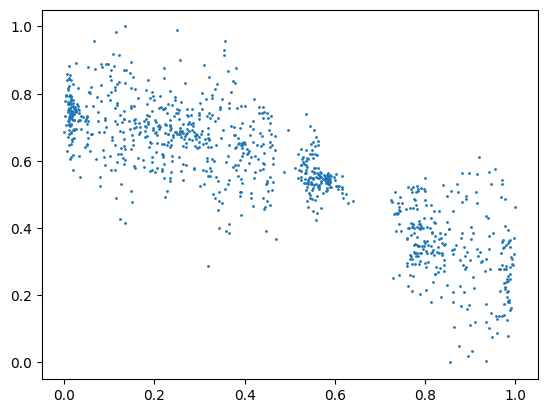

In [26]:
# z0 = np.load("../DVHL/exp1/data/24.npy") # 0, 24
# idx = np.random.choice(z0.shape[0], 1000, replace=False)
# z0 = z0[idx]
# z0 = torch.load("../DVHL/runs/DVHL__ppo__0417170009__3407/z_iter8_step3.pt").numpy()
z0 = torch.load("../DVHL/runs/DVHL__ppo__0507223735__3407/z_iter22_step16.pt").numpy()
z0 = normalise(z0)
print("shape: {}".format(z0.shape))

plt.scatter(z0[:,0], z0[:,1], s=1)
plt.show()

silhouette score: 0.3609


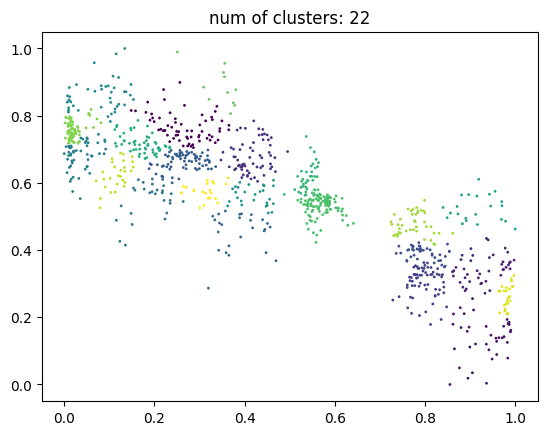

In [27]:
agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
agc.fit(z0)

sil = silhouette_score(z0, agc.labels_)
print("silhouette score: {:.4f}".format(sil))

plt.scatter(z0[:,0], z0[:,1], c=agc.labels_, s=1)
plt.title("num of clusters: {}".format(len(np.unique(agc.labels_))))
plt.show()

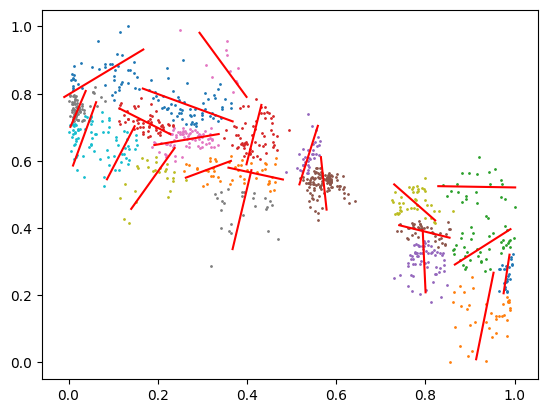

(220, 2)

In [28]:
from scipy.spatial.distance import pdist, squareform

points = []
for i in range(len(np.unique(agc.labels_))):
    cluster = z0[agc.labels_==i]

    pca = PCA(n_components=1)
    pca.fit(cluster)

    # Extract principal components
    components = pca.components_
    long_axis = components[0]

    mean_point = np.mean(cluster, axis=0)
    distance_matrix = squareform(pdist(cluster))
    major_axis_length = np.max(distance_matrix)
    endpoint1 = mean_point - long_axis * (major_axis_length / 2)
    endpoint2 = mean_point + long_axis * (major_axis_length / 2)

    plt.plot([endpoint1[0], endpoint2[0]], [endpoint1[1], endpoint2[1]], color='red', label='Long Axis')
    plt.scatter(z0[agc.labels_==i][:,0], z0[agc.labels_==i][:,1], s=1)

    points.append(endpoint1)
    points.append(endpoint2)

    points.extend(generate_points_on_segment(endpoint1, endpoint2, num_points=8))

plt.show()

points = np.vstack(points)
points.shape

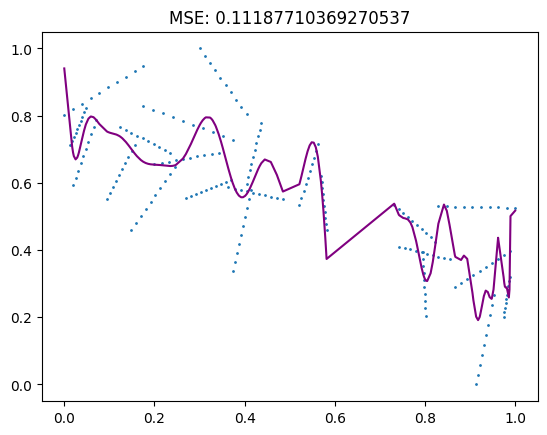

In [29]:
# preprocessing
# # 1. rotate to x-axis
# pca = PCA(n_components=2)
# pca.fit(points)
# components = pca.components_
# max_variance_direction = components[0]
# angle = np.arctan2(max_variance_direction[1], max_variance_direction[0])
# rotation_matrix = np.array([[np.cos(angle), -np.sin(angle)],
#                              [np.sin(angle), np.cos(angle)]])
# points = np.dot(points, rotation_matrix)
# 2. sort based on x
points = points[np.argsort(points[:, 0])]
# 3. normalise
points = normalise(points)


poly = PolynomialFeatures(degree=100, include_bias=False)
poly_features = poly.fit_transform(points[:, 0].reshape(-1, 1))

poly_reg = LinearRegression()
poly_reg.fit(poly_features, points[:, 1])

# print(poly_reg.intercept_, poly_reg.coef_)

plt.scatter(points[:, 0], points[:, 1], s=1)

x = points[:, 0].reshape(-1,1)
y_pred = poly_reg.predict(poly.transform(x))

mse = np.sqrt(mean_squared_error(points[:, 1], y_pred))

plt.plot(points[:, 0], y_pred, color='purple')
plt.title("MSE: {}".format(mse))

plt.show()

# Data-Driven

### 1. PH Dim

In [6]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Mon Sep 16 09:47:15 2019

@author: daniel
"""

def fractal_dimension(array, max_box_size = None, min_box_size = 1, n_samples = 20, n_offsets = 0, plot = False):
    """Calculates the fractal dimension of a 3D numpy array.
    
    Args:
        array (np.ndarray): The array to calculate the fractal dimension of.
        max_box_size (int): The largest box size, given as the power of 2 so that
                            2**max_box_size gives the sidelength of the largest box.                     
        min_box_size (int): The smallest box size, given as the power of 2 so that
                            2**min_box_size gives the sidelength of the smallest box.
                            Default value 1.
        n_samples (int): number of scales to measure over.
        n_offsets (int): number of offsets to search over to find the smallest set N(s) to
                       cover  all voxels>0.
        plot (bool): set to true to see the analytical plot of a calculation.
                            
        
    """
    #determine the scales to measure on
    if max_box_size == None:
        #default max size is the largest power of 2 that fits in the smallest dimension of the array:
        max_box_size = int(np.floor(np.log2(np.min(array.shape))))
    scales = np.floor(np.logspace(max_box_size,min_box_size, num = n_samples, base =2 ))
    scales = np.unique(scales) #remove duplicates that could occur as a result of the floor
    
    #get the locations of all non-zero pixels
    locs = np.where(array > 0)
    voxels = np.array([(x,y) for x,y in zip(*locs)])
    
    #count the minimum amount of boxes touched
    Ns = []
    #loop over all scales
    for scale in scales:
        touched = []
        if n_offsets == 0:
            offsets = [0]
        else:
            offsets = np.linspace(0, scale, n_offsets)
        #search over all offsets
        for offset in offsets:
            bin_edges = [np.arange(0, i, scale) for i in array.shape]
            bin_edges = [np.hstack([0-offset,x + offset]) for x in bin_edges]
            H1, e = np.histogramdd(voxels, bins = bin_edges)
            touched.append(np.sum(H1>0))
        Ns.append(touched)
    Ns = np.array(Ns)
    
    #From all sets N found, keep the smallest one at each scale
    Ns = Ns.min(axis=1)
   
    
    
    #Only keep scales at which Ns changed
    scales  = np.array([np.min(scales[Ns == x]) for x in np.unique(Ns)])
    
    
    Ns = np.unique(Ns)
    Ns = Ns[Ns > 0]
    scales = scales[:len(Ns)]
    #perform fit
    coeffs = np.polyfit(np.log(1/scales), np.log(Ns),1)
    
    #make plot
    if plot:
        fig, ax = plt.subplots(figsize = (8,6))
        ax.scatter(np.log(1/scales), np.log(np.unique(Ns)), c = "teal", label = "Measured ratios")
        ax.set_ylabel("$\log N(\epsilon)$")
        ax.set_xlabel("$\log 1/ \epsilon$")
        fitted_y_vals = np.polyval(coeffs, np.log(1/scales))
        ax.plot(np.log(1/scales), fitted_y_vals, "k--", label = f"Fit: {np.round(coeffs[0],3)}X+{coeffs[1]}")
        ax.legend()

    return (coeffs[0])

In [ ]:
fractal_dimension(z0)

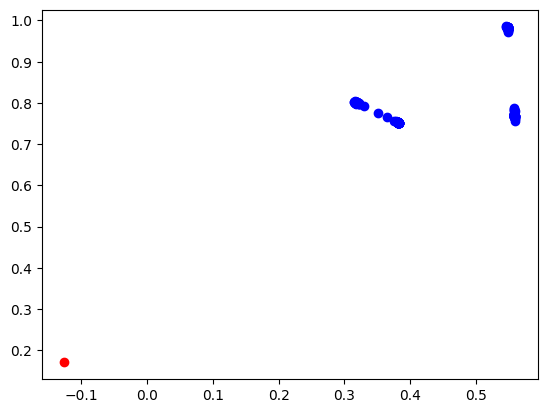

In [14]:
plt.scatter(cluster[:,0], cluster[:,1], color='blue')
plt.scatter(cluster_1.min(), cluster_1.max(), color='red')


In [21]:
z1 = np.load("../DVHL/exp1/data/1.npy")
ph1 = calculate_ph_dim(z1)
ph1

1.1085920420628734

In [118]:
z2 = np.load("../DVHL/exp1/data/2.npy")
ph2 = calculate_ph_dim(z2)
ph2

1.2050519221136593

In [8]:
z = torch.load("../DVHL/runs/DVHL__ppo__0417170009__3407/z_iter1_step0.pt")
ph = calculate_ph_dim(z2)
ph

1.100037683585541

In [17]:
z = torch.load("../DVHL/runs/DVHL__ppo__0417170009__3407/z_iter7_step7.pt")
ph = calculate_ph_dim(z2)
ph

1.1015665045543455

In [2]:
data1 = np.load("./scRNA-DR2020/data/hiv_70.npy", allow_pickle=True)
# labels = np.load("./scRNA-DR2020/data/kazer_raw_labels.npy", allow_pickle=True)

data1.shape

(59286, 70)

In [22]:
data2 = np.load("./scRNA-DR2020/data/kazer_pcares.npy", allow_pickle=True)
# labels = np.load("./scRNA-DR2020/data/kazer_raw_labels.npy", allow_pickle=True)
color.shape

(59286,)

In [3]:
label_csv = pd.read_csv('./scRNA-DR2020/figures/fig_data/kazer_label.csv')
label_np = np.array(label_csv['x'])

color_dict = {'NK cell': 6, 'DCs': 7, 'T cell': 1, 'B cell': 4, 'CTLs': 5, 'monocyte': 2, 'plasmablast': 3}

color = np.zeros(label_np.shape)
for i in range(color.shape[0]):
    color[i] = color_dict[label_np[i]]

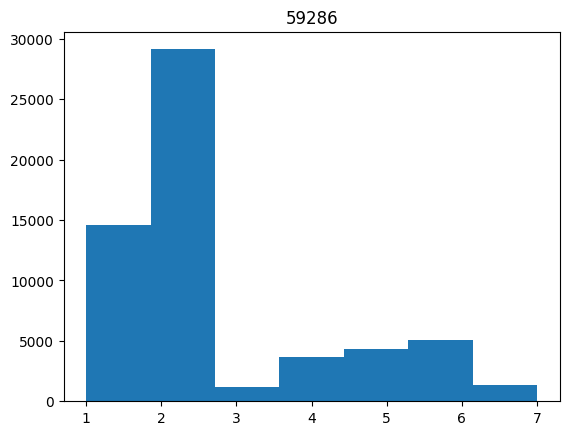

In [4]:
plt.hist(color, bins=7)
plt.title(len(color))
plt.show()

In [5]:
pcm = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0)
z1 = pcm.fit_transform(data1)
print(z1.shape)

plt.figure(figsize=(16,16), dpi=600)
plt.scatter(z1[:,0], z1[:,1], c=color, s=0.5, cmap=plt.get_cmap("RdYlGn_r"), label=label_np)

plt.show()

# 1m 3.2s

(59286, 2)


In [72]:
from sklearn.cluster import AgglomerativeClustering
import time

t1 = time.time()
agc = AgglomerativeClustering(n_clusters=None, distance_threshold=3)
# agc = AgglomerativeClustering(n_clusters=7, distance_threshold=None)

idx = np.random.choice(data1.shape[0], 5000, replace=False)
agc.fit(normalise(z1[idx]))

t2 = time.time()

plt.figure(figsize=(16,16), dpi=600)

plt.scatter(z1[idx,0], z1[idx,1], c=agc.labels_, s=1, cmap=plt.get_cmap("RdYlGn_r"))
plt.title("{} clusters, time: {:.3}".format(len(np.unique(agc.labels_)), t2-t1))

plt.legend()

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


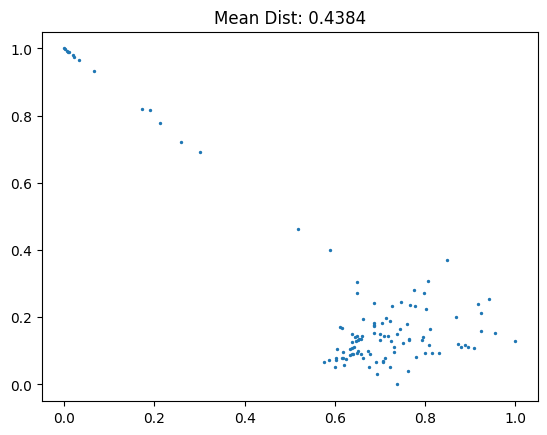

In [79]:
subcluster = z1[idx][agc.labels_==6]
subcluster = normalise(subcluster)

distances = np.linalg.norm(subcluster - np.mean(subcluster), axis=1)
mean_distance = np.mean(distances)

plt.scatter(subcluster[:, 0], subcluster[:, 1], s=2)
plt.title("Mean Dist: {:.4f}".format(mean_distance))
plt.show()

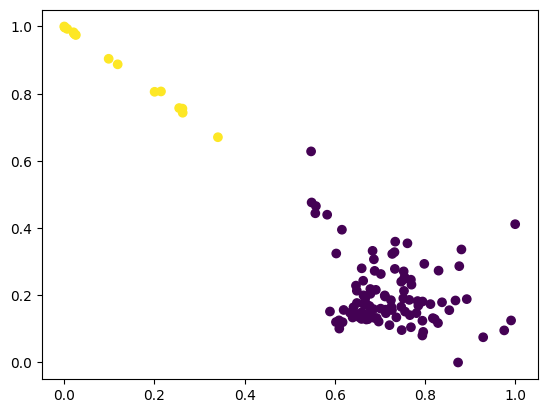

In [71]:
agc1 = AgglomerativeClustering(n_clusters=None, distance_threshold=3)
agc1.fit(subcluster)
plt.scatter(subcluster[:, 0], subcluster[:, 1], c=agc1.labels_)
plt.show()

In [39]:
pcm = pacmap.PaCMAP(n_components=2, n_neighbors=15, MN_ratio=0.5, FP_ratio=10.0)
z1 = pcm.fit_transform(data1)
print(z1.shape)

plt.figure(figsize=(16,16), dpi=600)
plt.scatter(z1[:,0], z1[:,1], c=color, s=0.5, cmap=plt.get_cmap("RdYlGn_r"), label=label_np)

plt.show()

(59286, 2)


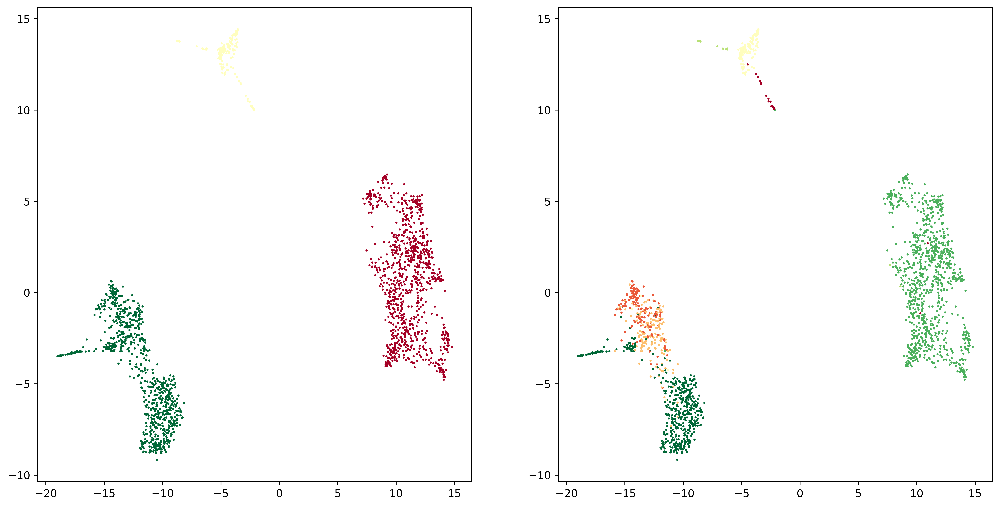

In [36]:
import hdbscan

hdb = hdbscan.HDBSCAN(min_cluster_size=5, min_samples=10, cluster_selection_epsilon=10)

idx = np.random.choice(data1.shape[0], 2000, replace=False)
pcm = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0)
# z1 = pcm.fit_transform(data1)
# z1_1k = z1[idx]
z1_1k = pcm.fit_transform(data1[idx])

hdb.fit(z1_1k)

plt.figure(figsize=(16,8), dpi=600)

plt.subplot(121)
plt.scatter(z1_1k[:,0], z1_1k[:,1], c=hdb.labels_, s=1, cmap=plt.get_cmap("RdYlGn_r"), label=label_np[idx])

plt.subplot(122)
plt.scatter(z1_1k[:,0], z1_1k[:,1], c=color[idx], s=1, cmap=plt.get_cmap("RdYlGn_r"), label=label_np)

plt.show()

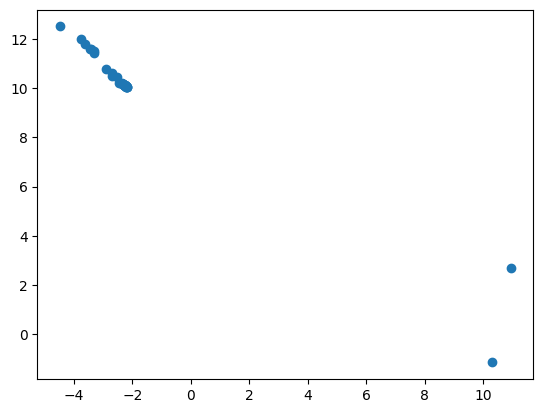

In [38]:
DCs = np.where(label_np[idx]=="DCs")[0]
plt.scatter(z1_1k[DCs, 0], z1_1k[DCs, 1])
plt.title(len(DCs))
plt.show()

In [16]:
np.unique(hdb.labels_)

array([0, 1], dtype=int64)

d:\anaconda3\envs\dr\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


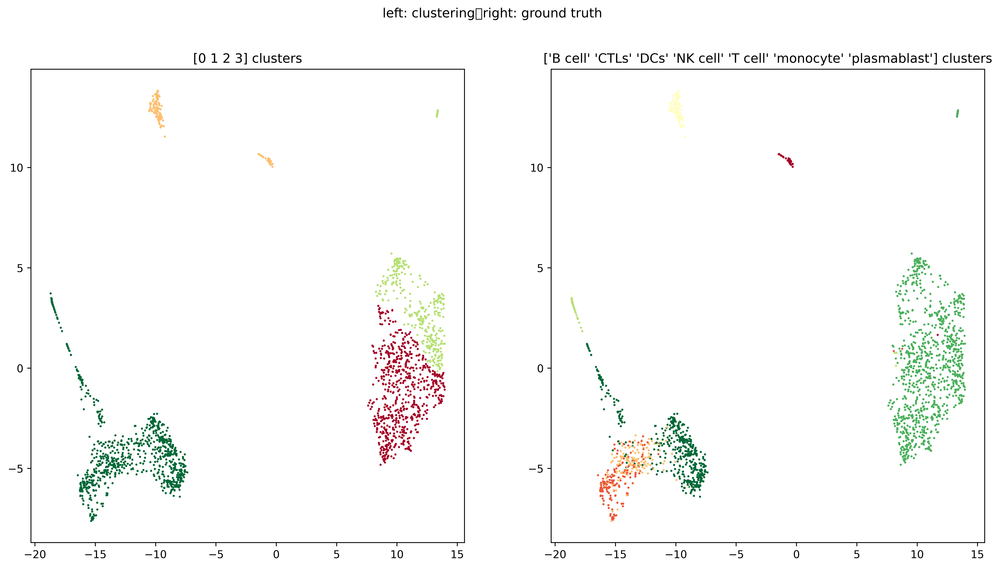

In [15]:
from sklearn.cluster import AgglomerativeClustering

agc = AgglomerativeClustering(n_clusters=None, distance_threshold=5)

idx = np.random.choice(data1.shape[0], 2000, replace=False)
pcm = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0)
# z1 = pcm.fit_transform(data1)
# z1_1k = z1[idx]
z1_1k = pcm.fit_transform(data1[idx])

agc.fit(normalise(z1_1k))

plt.figure(figsize=(16,8), dpi=600)

plt.subplot(121)
plt.scatter(z1_1k[:,0], z1_1k[:,1], c=agc.labels_, s=1, cmap=plt.get_cmap("RdYlGn_r"))
plt.title("{} clusters".format(np.unique(agc.labels_)))

plt.subplot(122)
plt.scatter(z1_1k[:,0], z1_1k[:,1], c=color[idx], s=1, cmap=plt.get_cmap("RdYlGn_r"))
plt.title("{} clusters".format(np.unique(label_np[idx])))

plt.suptitle("left: clustering\tright: ground truth")

plt.show()

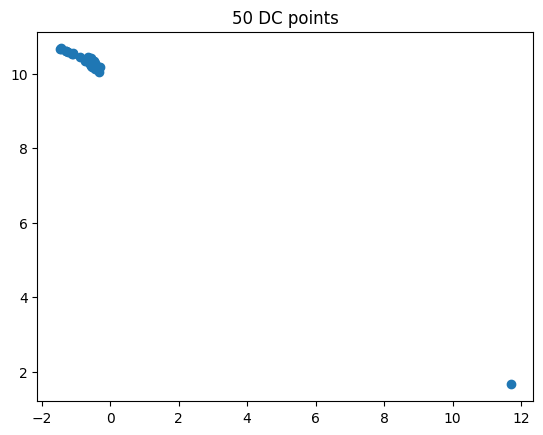

In [16]:
DCs = np.where(label_np[idx]=="DCs")[0]
plt.scatter(z1_1k[DCs, 0], z1_1k[DCs, 1])
plt.title("{} DC points".format(len(DCs)))
plt.show()

### 2. Accuracy + Scagnostics + Saparability

In [7]:
def gauss_clusters(
    n_clusters=10, dim=10, pts_cluster=100, random_state=None, cov=1, stepsize=1,
):

    if random_state is None:
        rng = np.random.RandomState()
    else:
        rng = random_state

    n = n_clusters * pts_cluster

    s = stepsize / np.sqrt(dim)
    means = np.linspace(np.zeros(dim), n_clusters * s, num=n_clusters, endpoint=False)
    cshift_mask = np.zeros(n_clusters, dtype=bool)
    cshift_mask[15] = True
    cov = np.eye(dim) * cov

    clusters = np.array(
        [rng.multivariate_normal(m, cov, size=(pts_cluster)) for m in means]
    )

    X = np.reshape(clusters, (-1, dim))

    y = np.repeat(np.arange(n_clusters), pts_cluster)
    return X, y

In [8]:
data, labels = gauss_clusters(
    n_clusters=20,
    dim=50,
    pts_cluster=1000,
    stepsize=6,
    random_state=None,
)
idx = np.random.choice(data.shape[0], 1000, replace=False)
data, labels = data[idx], labels[idx]
print(data.shape, labels.shape)

(1000, 50) (1000,)


In [9]:
import pacmap

# # z0 = np.load("../DVHL/exp1/data/24.npy") # 0, 24
# # idx = np.random.choice(z0.shape[0], 1000, replace=False)
# # z0 = z0[idx]
# # z0 = torch.load("../DVHL/runs/DVHL__ppo__0417170009__3407/z_iter8_step3.pt").numpy()
# z0 = torch.load("../DVHL/runs/DVHL__ppo__0507223735__3407/z_iter22_step16.pt").numpy()
# z0 = normalise(z0)
# print("shape: {}".format(z0.shape))

# plt.scatter(z0[:,0], z0[:,1], s=1)
# plt.show()

pcm = pacmap.PaCMAP(n_neighbors=15, MN_ratio=0.5, FP_ratio=20.0)
z = pcm.fit_transform(data)
z = normalise(z)

agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
# agc = AgglomerativeClustering(n_clusters=7, distance_threshold=None)
agc.fit(normalise(z))

plt.figure(figsize=(16,8))

plt.subplot(121)
plt.scatter(z[:,0], z[:,1], s=1, c=labels)
plt.title("real class: {}".format(len(np.unique(labels))))

plt.subplot(122)
plt.scatter(z[:,0], z[:,1], s=1, c=agc.labels_)
plt.title("predicted class: {}".format(len(np.unique(agc.labels_))))

plt.suptitle("left: ground truth, right: clustering")

plt.show()


C:\Users\wanzh\AppData\Local\Temp\ipykernel_12648\1571717525.py:34: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [8]:
import numba
from scipy.spatial.distance import pdist, squareform

@numba.njit("f4(f4[:,:],f4[:,:],i4[:,:],i4[:,:])", cache=True)
def QNX_K(dataset, visu, vK, nK):
    N = len(visu)
    K = len(vK[0])

    # acc = sum(map(lambda vnK: np.intersect1d(vnK[0], vnK[1]).size, zip(vK, nK)))

    # print(np.intersect1d(vK, nK))

    acc = 0 #[]#np.array([])
    for i in numba.prange(len(vK)):
        acc += np.intersect1d(vK[i], nK[i]).size

    return acc / (K * N)

@numba.njit("f4(f4[:,:],f4[:,:],i4[:,:],i4[:,:])", cache=True)
def RNX_K(dataset, visu, vK, nK):
    N = len(visu)
    K = len(vK[0])
    # print(dataset.shape, visu.shape, vK.shape, nK.shape)
    # print(dataset.dtype, visu.dtype, vK.dtype, nK.dtype)
    QNX = QNX_K(dataset, visu, vK, nK)

    numerator = ((N - 1) * QNX) - K
    denominator = N - 1 - K

    return numerator / denominator

@numba.njit("f4(f4[:,:],f4[:,:],i4[:,:],i4[:,:])", parallel=True, nogil=True, cache=True)
def logRNX(dataset, visu, I_dataset, I_projection):
    N = len(visu)

    # D_dataset = squareform(pdist(dataset))
    # D_projection = squareform(pdist(visu))

    numerator = 0.0
    denominator = 0.0

    # I_dataset = np.argsort(D_dataset, 1)[:, 1:].astype('int32')
    # I_projection = np.argsort(D_projection, 1)[:, 1:].astype('int32')

    for k in numba.prange(1, N - 1):
        vK = I_projection[:, :k]
        nK = I_dataset[:, :k]

        numerator += (RNX_K(dataset, visu, vK, nK) / k)
        denominator += (1.0 / k)

    return numerator / denominator


def compute_AUClogRNX(data, visu):
    """ Compute AUClogRNX
    Inputs
    ------
    data = high dimensional data
    visu = low dimensional data

    Output
    ------
    return the log of the AUC of K neighborhoods for a growing K
    """

    D_dataset = squareform(pdist(data)).astype('float32')
    D_projection = squareform(pdist(visu)).astype('float32')

    # print(D_dataset.shape, D_dataset.dtype, D_projection.shape, D_projection.dtype)

    I_dataset = np.argsort(D_dataset, 1)[:, 1:].astype('int32')
    I_projection = np.argsort(D_projection, 1)[:, 1:].astype('int32')

    return logRNX(data, visu, I_dataset, I_projection)


In [41]:
compute(data=data, visu=z)
# 1m2.1s

0.48212481842233973

In [10]:
compute_AUClogRNX(data=data.astype('float32'), visu=z.astype('float32'))
# 10.2s

0.3662653863430023

In [9]:
import os
import rpy2.robjects as robjects

path = '.'

def compute_scagnostics(x, y):
    # print(os.getcwd())
    all_scags = {}
    r_source = robjects.r['source']
    # r_source(os.path.join(path, '../../DRflow/metrics/get_scag.r'))
    r_source(os.path.join('./get_scag.r'))
    # print(os.path.join('./metrics/get_scag.r'))
    r_getname = robjects.globalenv['scags']
    scags = r_getname(robjects.FloatVector(x), robjects.FloatVector(y))
    all_scags['outlying'] = scags[0]
    all_scags['skewed'] = scags[1]
    all_scags['clumpy'] = scags[2]
    all_scags['sparse'] = scags[3]
    all_scags['striated'] = scags[4]
    all_scags['convex'] = scags[5]
    all_scags['skinny'] = scags[6]
    all_scags['stringy'] = scags[7]
    all_scags['monotonic'] = scags[8]
    return all_scags

In [12]:
compute_scagnostics(x=z[:,0], y=z[:,1])

{'outlying': 0.07034885492754854,
 'skewed': 0.6629126592310595,
 'clumpy': 0.13660541032515877,
 'sparse': 0.016823317152095778,
 'striated': 0.041353383458646614,
 'convex': 0.04698652729757043,
 'skinny': 0.8037459650458398,
 'stringy': 0.3784052421144531,
 'monotonic': 6.821584589411738e-05}

In [13]:
scag = compute_scagnostics(x=z[:,0], y=z[:,1])
[scag[k] for k in sorted(scag.keys())]

[0.13660541032515877,
 0.04698652729757043,
 6.821584589411738e-05,
 0.07034885492754854,
 0.6629126592310595,
 0.8037459650458398,
 0.016823317152095778,
 0.041353383458646614,
 0.3784052421144531]

In [10]:
# Compute the centroid of each label
def get_centroids(visu, labels):
    centroids = {}
    counter = {}

    for index in range(len(visu)):
        if labels[index] in centroids:
            centroids[labels[index]] = (
                centroids[labels[index]][0] + visu[index][0], centroids[labels[index]][1] + visu[index][1])
            counter[labels[index]] += 1.0
        else:
            centroids[labels[index]] = (visu[index][0], visu[index][1])
            counter[labels[index]] = 1.0

    for label in centroids.keys():
        centroids[label] = (centroids[label][0] / counter[label], centroids[label][1] / counter[label])

    return centroids


# Compute DSC
# In order to be comparable amongs different visualizations, the result is divided by the number of points.
def compute_dsc(visu, labels):
    centroids = get_centroids(visu, labels)

    misclassified_counter = 0.0
    for index in range(len(visu)):
        distance_centroid = pdist([visu[index], centroids[labels[index]]])
        min_distance = distance_centroid  # init
        for label in centroids.keys():
            distance = pdist([visu[index], centroids[label]])
            if distance < min_distance:
                min_distance = distance

        if min_distance < distance_centroid:  # If the minimal distance is not the distance between the point and the centroid of its class
            misclassified_counter += 1.0

    return misclassified_counter / len(visu)

In [15]:
compute_dsc(z, agc.labels_)

0.0

In [11]:
from sklearn.metrics import silhouette_score

def compute_silhouette(visu, labels):
	return silhouette_score(visu, labels)

In [ ]:
compute_silhouette(z, agc.labels_)

### 3. feature generation func

In [6]:
import networkx as nx
import time

def generate_feature(z, labels, data, use_auclogrnx=True):
    # 1. scagnostics
    scag = compute_scagnostics(z[:,0], z[:,1])

    # 2. separability
    dsc = compute_dsc(z, labels)
    sc = compute_silhouette(z, labels)

    # 3. accuracy
    if use_auclogrnx:
        auclogrnx = compute_AUClogRNX(data=data.astype('float32'), visu=z.astype('float32'))

    # 4. extra
    mst_length = MST_length(z)
    phd = calculate_ph_dim(z)

    # feature
    feats = []
    feats.extend([scag[k] for k in sorted(scag.keys())])
    feats.append(dsc)
    feats.append(sc)
    if use_auclogrnx:
        feats.append(auclogrnx)
    feats.append(mst_length)
    feats.append(phd)

    return np.array(feats)

# t1 = time.time()
# feats = generate_feature(z=z, labels=agc.labels_, data=data)
# t2 = time.time()
# feats.shape, t2-t1

In [18]:
feats

array([1.36605410e-01, 4.69865273e-02, 6.82158459e-05, 7.03488549e-02,
       6.62912659e-01, 8.03745965e-01, 1.68233172e-02, 4.13533835e-02,
       3.78405242e-01, 0.00000000e+00, 8.26447010e-01, 3.94475043e-01,
       6.13262194e+00, 1.46231852e+00])

In [18]:
# data, labels = gauss_clusters(
#     n_clusters=20,
#     dim=50,
#     pts_cluster=1000,
#     stepsize=6,
#     random_state=None,
# )

# pcm = pacmap.PaCMAP(n_neighbors=15, MN_ratio=0.5, FP_ratio=20.0)
# z = pcm.fit_transform(data)
# z = normalise(z)

# agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
# agc.fit(normalise(z))

# print("generating 20k...")
# f1 = generate_feature(z=z, labels=agc.labels_, data=data, use_auclogrnx=False)

# print("generating 1k...")
# idx = np.random.choice(z.shape[0], 1000, replace=False)
# f2 = generate_feature(z=z[idx], labels=agc.labels_[idx], data=data[idx])

# f1, f2

generating 20k...
generating 1k...


(array([9.99443047e-02, 7.86269357e-02, 6.92215385e-04, 2.90549445e-01,
        8.87299149e-01, 8.43492769e-01, 2.59163934e-02, 3.74707260e-02,
        4.06809485e-01, 7.00000000e-04, 8.37132394e-01, 2.63047641e+01,
        1.47853886e+00]),
 array([1.02698468e-01, 1.99972270e-01, 9.23708422e-04, 2.23825922e-01,
        9.49785190e-01, 8.47939671e-01, 6.17660748e-02, 2.21238938e-02,
        3.09803213e-01, 1.00000000e-03, 8.32527459e-01, 3.32809925e-01,
        6.67909461e+00, 1.46939619e+00]))

In [30]:
# f1[-2:] - f2[-2:]

array([1.96256694e+01, 9.14267300e-03])

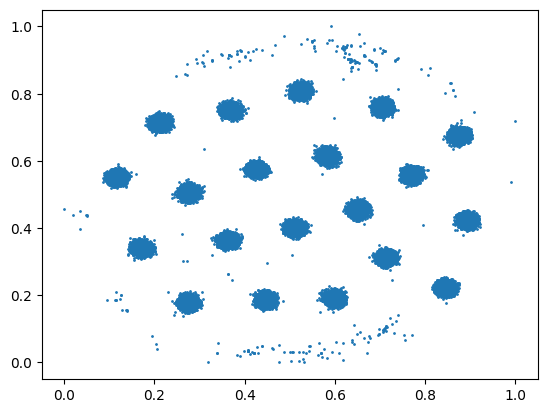

In [25]:
plt.scatter(z[:,0], z[:,1], s=1)

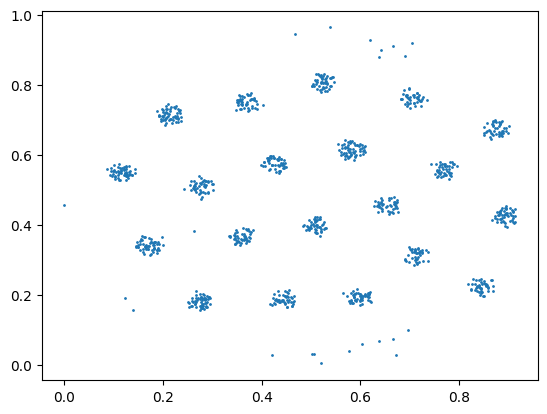

In [27]:
plt.scatter(z[idx][:,0], z[idx][:,1], s=1)

In [13]:
data, labels = gauss_clusters(
    n_clusters=20,
    dim=50,
    pts_cluster=1000,
    stepsize=6,
    random_state=None,
)

data.shape, labels.shape

((20000, 50), (20000,))

In [36]:
for n_neighbors in [None, 10, 20, 50]:
    for MN_ratio in [0.5, 1.0, 5.0, 10.0]:
        for FP_ratio in [1.0, 2.0, 5.0]:

            N = data.shape[0]
            pcm = pacmap.PaCMAP(n_components=2, n_neighbors=n_neighbors, MN_ratio=MN_ratio, FP_ratio=FP_ratio)
            z = pcm.fit_transform(data, init="pca")

            title = "n{}_MN{}_FP{}".format(n_neighbors, MN_ratio, FP_ratio)
            print(title)

            np.save("./data/offline_{}.npy".format(title), z)
            draw_z(z=normalise(z), cls=labels, s=1, save_path="./data/offline_{}.png".format(title), display=False, title=title)


nNone_MN0.5_FP1.0
nNone_MN0.5_FP2.0
nNone_MN0.5_FP5.0
nNone_MN1.0_FP1.0
nNone_MN1.0_FP2.0
nNone_MN1.0_FP5.0
nNone_MN5.0_FP1.0
nNone_MN5.0_FP2.0
nNone_MN5.0_FP5.0
nNone_MN10.0_FP1.0
nNone_MN10.0_FP2.0
nNone_MN10.0_FP5.0
n10_MN0.5_FP1.0
n10_MN0.5_FP2.0
n10_MN0.5_FP5.0
n10_MN1.0_FP1.0
n10_MN1.0_FP2.0
n10_MN1.0_FP5.0
n10_MN5.0_FP1.0
n10_MN5.0_FP2.0


d:\anaconda3\envs\dr\lib\site-packages\seaborn\axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


n10_MN5.0_FP5.0


C:\Users\wanzh\AppData\Local\Temp\ipykernel_8208\3129687526.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 10), dpi=dpi)


n10_MN10.0_FP1.0
n10_MN10.0_FP2.0
n10_MN10.0_FP5.0
n20_MN0.5_FP1.0
n20_MN0.5_FP2.0
n20_MN0.5_FP5.0
n20_MN1.0_FP1.0
n20_MN1.0_FP2.0
n20_MN1.0_FP5.0
n20_MN5.0_FP1.0
n20_MN5.0_FP2.0
n20_MN5.0_FP5.0
n20_MN10.0_FP1.0
n20_MN10.0_FP2.0
n20_MN10.0_FP5.0
n50_MN0.5_FP1.0
n50_MN0.5_FP2.0
n50_MN0.5_FP5.0
n50_MN1.0_FP1.0
n50_MN1.0_FP2.0
n50_MN1.0_FP5.0
n50_MN5.0_FP1.0
n50_MN5.0_FP2.0
n50_MN5.0_FP5.0
n50_MN10.0_FP1.0
n50_MN10.0_FP2.0
n50_MN10.0_FP5.0


In [43]:
np.save("./data/data.npy", data)
np.save("./data/labels.npy", labels)

In [14]:
import pickle
import glob

offline = glob.glob("./data/offline_n*.npy")
online = glob.glob("../DVHL/runs/DVHL__ppo__0509213057__3407/z_iter*.pt")

len(offline), len(online)

(48, 27)

In [63]:
offline_y = []

for i in range(len(offline)):

    feedback = int(input('\nDo you like the visualisation {} in general?\n\tScore from 1 to 5:'.format(offline[i])))
    offline_y.append(feedback)

np.save("./data/offline_y.npy", np.array(offline_y))

In [74]:
online_y = []

for i in range(len(online)):

    feedback = int(input('\nDo you like the visualisation {} in general?\n\tScore from 1 to 5:'.format(online[i])))
    online_y.append(feedback)

np.save("./data/online_y.npy", np.array(online_y))

In [28]:
offline

['./data\\offline_n10_MN0.5_FP1.0.npy',
 './data\\offline_n10_MN0.5_FP2.0.npy',
 './data\\offline_n10_MN0.5_FP5.0.npy',
 './data\\offline_n10_MN1.0_FP1.0.npy',
 './data\\offline_n10_MN1.0_FP2.0.npy',
 './data\\offline_n10_MN1.0_FP5.0.npy',
 './data\\offline_n10_MN10.0_FP1.0.npy',
 './data\\offline_n10_MN10.0_FP2.0.npy',
 './data\\offline_n10_MN10.0_FP5.0.npy',
 './data\\offline_n10_MN5.0_FP1.0.npy',
 './data\\offline_n10_MN5.0_FP2.0.npy',
 './data\\offline_n10_MN5.0_FP5.0.npy',
 './data\\offline_n20_MN0.5_FP1.0.npy',
 './data\\offline_n20_MN0.5_FP2.0.npy',
 './data\\offline_n20_MN0.5_FP5.0.npy',
 './data\\offline_n20_MN1.0_FP1.0.npy',
 './data\\offline_n20_MN1.0_FP2.0.npy',
 './data\\offline_n20_MN1.0_FP5.0.npy',
 './data\\offline_n20_MN10.0_FP1.0.npy',
 './data\\offline_n20_MN10.0_FP2.0.npy',
 './data\\offline_n20_MN10.0_FP5.0.npy',
 './data\\offline_n20_MN5.0_FP1.0.npy',
 './data\\offline_n20_MN5.0_FP2.0.npy',
 './data\\offline_n20_MN5.0_FP5.0.npy',
 './data\\offline_n50_MN0.5_FP1.0.

In [21]:
from tqdm import tqdm

data_offline = np.load("./data/data.npy")               # (20000, 50)
labels_offline = np.load("./data/labels.npy")           # (20000, )

data_online = np.load("../DVHL/runs/DVHL__ppo__0509213057__3407/data_online_1k.npy")        # (1000, 50)
labels_online = np.load("../DVHL/runs/DVHL__ppo__0509213057__3407/labels_online_1k.npy")    # (1000)

offline_y = np.load("./data/offline_y.npy")             # (48,)
online_y = np.load("./data/online_y.npy")               # (27,)

offline_pairs = []
for i in range(len(offline)):
    for j in range(len(offline)):
        if i==j:
            continue
        else:
            y = 1 if offline_y[i] > offline_y[j] else 0
            offline_pairs.append((i,j,y))

online_pairs = []
for i in range(len(online)):
    for j in range(len(online)):
        if i==j:
            continue
        else:
            y = 1 if online_y[i] > online_y[j] else 0
            online_pairs.append((i,j,y))

offline_features = []
offline_sample_idx = []
for i in tqdm(range(len(offline))):
    z = np.load(offline[i])
    idx = np.random.choice(z.shape[0], 1000, replace=False)
    offline_sample_idx.append(idx)
    z = z[idx]
    
    agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
    agc.fit(normalise(z))
    
    feats = generate_feature(z=z, labels=agc.labels_, data=data_offline[idx])
    offline_features.append(feats)

online_features = []
for i in tqdm(range(len(online))):
    z = torch.load(online[i]).numpy()

    agc = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5)
    agc.fit(normalise(z))

    feats = generate_feature(z=z, labels=agc.labels_, data=data_online)
    online_features.append(feats)

100%|██████████| 27/27 [05:26<00:00, 12.08s/it]


In [22]:
np.save("./data/online_pairs.npy", online_pairs)
np.save("./data/offline_pairs.npy", offline_pairs)

np.save("./data/online_features.npy", online_features)
np.save("./data/offline_features.npy", offline_features)

In [7]:
online_pairs = np.load("./data/online_pairs.npy")
offline_pairs = np.load("./data/offline_pairs.npy")

online_features = np.load("./data/online_features.npy")
offline_features = np.load("./data/offline_features.npy")

In [8]:
offline_set_X = []
offline_set_y = []
for i in range(len(offline_pairs)):
    idx1 = offline_pairs[i][0]
    idx2 = offline_pairs[i][1]
    y = offline_pairs[i][2]
    
    X = np.hstack([offline_features[idx1], offline_features[idx2]])

    offline_set_X.append(X)
    offline_set_y.append(y)

online_set_X = []
online_set_y = []
for i in range(len(online_pairs)):
    idx1 = online_pairs[i][0]
    idx2 = online_pairs[i][1]
    y = online_pairs[i][2]
    
    X = np.hstack([online_features[idx1], online_features[idx2]])

    online_set_X.append(X)
    online_set_y.append(y)

len(offline_set_X), len(offline_set_y), len(online_set_X), len(online_set_y)

(2256, 2256, 702, 702)

In [21]:
X = np.vstack(offline_set_X + online_set_X)
y = np.hstack(offline_set_y + online_set_y)
X.shape, y.shape

((2958, 28), (2958,))

In [24]:
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

# lgb.fit(X, y)
# y_pred = lgb.predict(X)
# accuracy_score(y_pred=y_pred, y_true=y)


# best = [0.0, 0.0]
# best_param = []

# for nl in [16,24,31]:
#     for md in [8,12,16,32,-1]:
#         for ne in [50,100,200]:
#             for reg_lambda in [0.0, 0.1]:
                
#                 lgb = LGBMClassifier(num_leaves=nl, max_depth=md, n_estimators=ne, reg_lambda=reg_lambda)

#                 scores = cross_val_score(lgb, X, y, cv=5)
#                 if scores.mean() > best[0]:
#                     best = [scores.mean(), scores.std()]
#                     best_param = [nl, md, ne, reg_lambda]
#                     print("best param: ", nl, md, ne, reg_lambda)
#                     print("best acc: ", best[0], best[1])


# rf = RandomForestClassifier(n_estimators=100, max_depth=None, min_samples_split=2, max_leaf_nodes=None)
# rf.fit(X, y)
# y_pred = rf.predict(X)
# accuracy_score(y_pred=y_pred, y_true=y)

best = [0.0, 0.0]
best_param = []

for ne in [50,100,200]:
    for md in [8,12,16,32,None]:
        for mss in [2,5,10,20]:
                
                rf = RandomForestClassifier(n_estimators=ne, max_depth=md, min_samples_split=mss)

                scores = cross_val_score(rf, X, y, cv=5)
                if scores.mean() > best[0]:
                    best = [scores.mean(), scores.std()]
                    best_param = [ne, md, mss]
                    print("best param: ", ne, md, mss)
                    print("best acc: ", best[0], best[1])

best param:  50 8 2
best acc:  0.87356004481639 0.04199783428449166
best param:  50 8 5
best acc:  0.8830074998856725 0.048440606166471306


In [73]:
rf = RandomForestClassifier(n_estimators=50, max_depth=8, min_samples_split=5)
rf.fit(X, y)
acc = accuracy_score(y_pred=rf.predict(X), y_true=y)
print(acc)

pickle.dump(rf, open("./data/rf.pkl", "wb"))

0.9996619337390128


In [24]:
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

# no AUClogRNX

X = np.delete(X, [11,25], axis=1)

best = [0.0, 0.0]
best_param = []

for ne in [50,100,200]:
    for md in [8,12,16,32,None]:
        for mss in [2,5,10,20]:
                
                rf = RandomForestClassifier(n_estimators=ne, max_depth=md, min_samples_split=mss)

                scores = cross_val_score(rf, X, y, cv=5)
                if scores.mean() > best[0]:
                    best = [scores.mean(), scores.std()]
                    best_param = [ne, md, mss]
                    print("best param: ", ne, md, mss)
                    print("best acc: ", best[0], best[1])

best param:  50 8 2
best acc:  0.8563051630310514 0.044274507525095715
best param:  50 12 2
best acc:  0.8603677916495176 0.043781703893070754
best param:  50 12 5
best acc:  0.8695019892989437 0.0272907377150773
best param:  50 None 2
best acc:  0.870843622810628 0.03627566616627286
best param:  50 None 10
best acc:  0.8765960122559108 0.027364247348114646


In [26]:
X.shape

(2958, 26)

In [27]:
import pickle

# no AUClogRNX

rf = RandomForestClassifier(n_estimators=100, max_depth=16, min_samples_split=2)
rf.fit(X, y)
acc = accuracy_score(y_pred=rf.predict(X), y_true=y)
print(acc)

pickle.dump(rf, open("./data/rf_noAUClogRNX.pkl", "wb"))

1.0


In [74]:
y[10:20]

array([1, 0, 1, 1, 0, 1, 1, 1, 1, 1])

In [75]:
tree.predict_proba(X[11].reshape(1,-1))

array([[1., 0.]])

100%|██████████| 2958/2958 [00:07<00:00, 375.42it/s]


(array([1597.,  121.,   35.,   19.,    7.,    6.,   12.,   50.,  140.,
         971.]),
 array([0.        , 0.09999031, 0.19998063, 0.29997094, 0.39996126,
        0.49995157, 0.59994189, 0.6999322 , 0.79992252, 0.89991283,
        0.99990315]),
 <BarContainer object of 10 artists>)

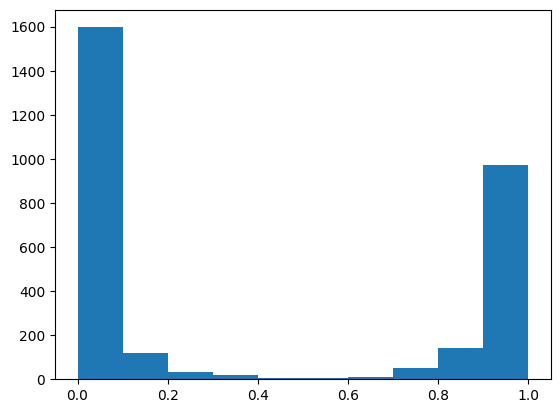

In [66]:
# %matplotlib inline
from tqdm import tqdm
all_outs=[]

for i in tqdm(range(X.shape[0])):
    out = []
    for tree in rf.estimators_:
        pred = tree.predict_proba(X[i].reshape(1,-1))
        out.append(pred[0][1])

    all_outs.append((np.mean(out), np.std(out)))

# plt.hist(out)
# plt.show()

# print(np.mean(out), np.std(out))

plt.hist([i[0] for i in all_outs])

In [59]:
# print("best param: ", nl, md, ne, reg_lambda)
# print("best acc: ", best[0], best[1])

best param:  31 -1 200 0.1
best acc:  0.9002715278730508 0.03518163626497901


In [63]:
# lgb = LGBMClassifier(num_leaves=31, max_depth=-1, n_estimators=200, reg_lambda=0.1)
# lgb.fit(X, y)
# acc = accuracy_score(y_pred=lgb.predict(X), y_true=y)
# print(acc)

# pickle.dump(lgb, open("./data/lgb.pkl", "wb"))

[LightGBM] [Info] Number of positive: 1177, number of negative: 1781
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000437 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1952
[LightGBM] [Info] Number of data points in the train set: 2958, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.397904 -> initscore=-0.414206
[LightGBM] [Info] Start training from score -0.414206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
1.0


In [64]:
# mylgb = pickle.load(open("./data/lgb.pkl", "rb"))
# acc = accuracy_score(y_pred=mylgb.predict(X), y_true=y)
# print(acc)

1.0
